# Apply ML algorithms

-Linear Regression  
-Lasso Regression  
-decision Tree Regression  
-KNN Regression  
-RandomForestRegressor  
-Xgboost Regressor  
-ANN-rtificial Neural Network  

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv("./Real-Data/real_Combine.csv")

In [3]:
df.head()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833


check for null values

<Axes: >

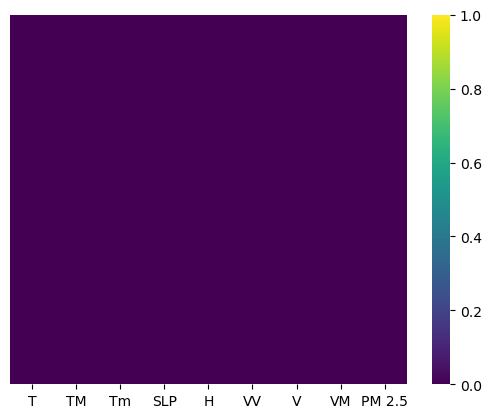

In [4]:
sns.heatmap(df.isnull(), yticklabels =False, cbar= True, cmap= 'viridis' )

In [5]:
df.isnull().sum()

T         0
TM        0
Tm        0
SLP       0
H         0
VV        0
V         0
VM        0
PM 2.5    1
dtype: int64

In [6]:
df = df.dropna()

split the data into dependent and independent features

In [7]:
X = df.iloc[:, : -1]
y = df.iloc[: , -1]

In [8]:
sns.pairplot(df)

In [9]:
df.corr()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.967276,0.958892,-0.884383,-0.518870,0.622637,0.326067,0.287138,-0.628336
TM,0.967276,1.000000,0.896699,-0.829254,-0.599629,0.598479,0.320116,0.299508,-0.569381
Tm,0.958892,0.896699,1.000000,-0.909514,-0.315305,0.560299,0.312904,0.259431,-0.669059
SLP,-0.884383,-0.829254,-0.909514,1.000000,0.274196,-0.491842,-0.346130,-0.299830,0.615615
H,-0.518870,-0.599629,-0.315305,0.274196,1.000000,-0.475279,-0.399079,-0.370981,0.174658
VV,0.622637,0.598479,0.560299,-0.491842,-0.475279,1.000000,0.402884,0.347493,-0.628621
V,0.326067,0.320116,0.312904,-0.346130,-0.399079,0.402884,1.000000,0.760777,-0.354799
VM,0.287138,0.299508,0.259431,-0.299830,-0.370981,0.347493,0.760777,1.000000,-0.283695
PM 2.5,-0.628336,-0.569381,-0.669059,0.615615,0.174658,-0.628621,-0.354799,-0.283695,1.000000


### Correlation Matrix with Heatmap

Correlation states how the faetures are related to each other or the target variable.

Correlation can be positive(increase in one value of features increases the value of the target variable)or negative(increase in one value of feature decrease the value of the target variable).

Heatmap makes it easy to identify which feature are most related to the target variable.we will plot heatmap of correlated feature using the seaborn library.

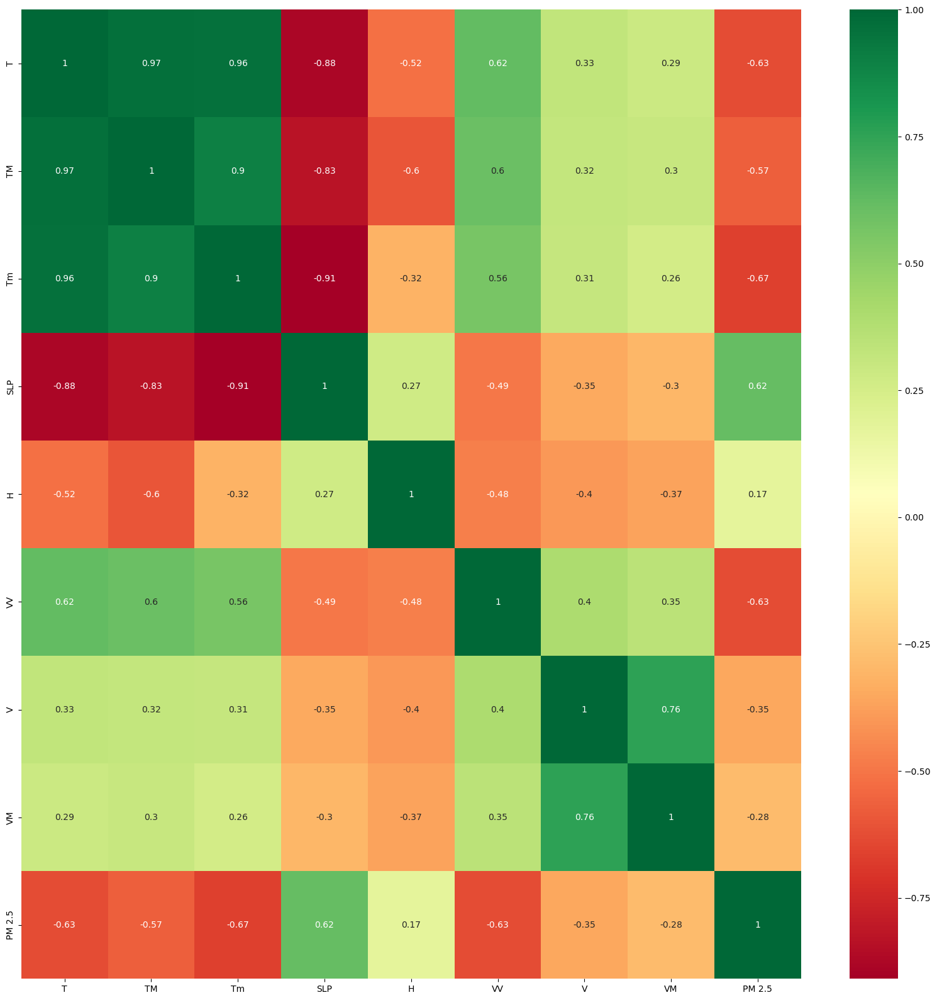

In [10]:
import seaborn as sns

corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize = (20,20))
g = sns.heatmap(df[top_corr_features].corr(), annot = True, cmap = "RdYlGn")

In [11]:
corrmat.index

Index(['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM', 'PM 2.5'], dtype='object')

### Feature importance
you can get the importance of each feature of your dataset by using the feature importance
property of the model.

Feature importance gives you a score for each feature of your data, the higher the score more
important or relevant is the feature towards your output variable.

Feature importance is an inbuilt class that comes with Tree Based regressor, we will bve using 
for Extra Tree Regressor for extracting the top 10 features of the dataset.


In [12]:
from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt
model = ExtraTreesRegressor()
model.fit(X,y)


ExtraTreesRegressor()

In [13]:
print(model.feature_importances_)

[0.15347521 0.09273133 0.18817836 0.1356391  0.0827491  0.25215941
 0.05369098 0.0413765 ]


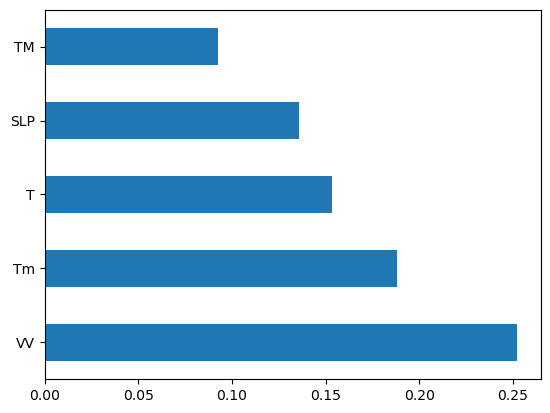

In [14]:
# plot graph for feature importance
feat_importances = pd.Series(model.feature_importances_, index = X.columns)
feat_importances.nlargest(5).plot(kind = 'barh')
plt.show()

<Axes: xlabel='PM 2.5', ylabel='Density'>

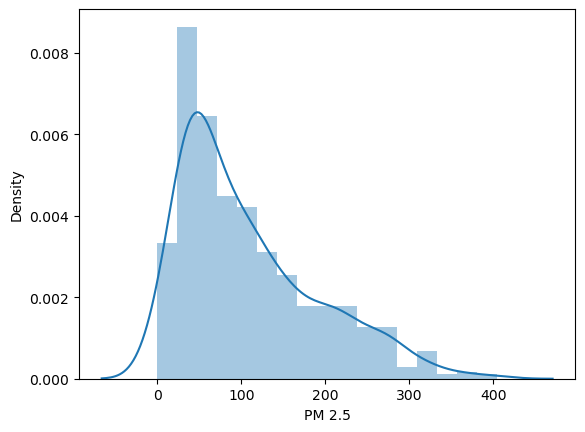

In [15]:
sns.distplot(y)

# Split the data into training and testing data


In [16]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.3, random_state = 0)

In [17]:
from sklearn.linear_model import LinearRegression

In [18]:
regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression()

# Coefficient of determination R^2


In [19]:
print('coffiecient of determination R^2 on training data is : ', regressor.score(X_train,y_train))

coffiecient of determination R^2 on training data is :  0.6007706404750854


In [20]:
print('coffiecient of determination R^2 on test data is : ', regressor.score(X_test,y_test))

coffiecient of determination R^2 on test data is :  0.5316188612878154


In [21]:
# crossvalidation

from sklearn.model_selection import cross_val_score
score = cross_val_score(regressor, X,y, cv= 5)

In [22]:
score.mean()

0.46724362258523316

# Model Evaluation

In [23]:
coeff_df = pd.DataFrame(regressor.coef_, X.columns, columns = ['Coefficients'])
coeff_df

,Coefficients
T,2.639490
TM,0.519979
Tm,-7.598118
SLP,0.493220
H,-0.837064
VV,-50.430135
V,-2.754178
VM,-0.039266


### interpreting the coefficients:  

- holding all other features fixed, a 1 unit increase in T is associated with a *decrease of 2.639 in AQI PM 2.5 *
- Holding all other features fixed, a 1 unit increase in TM is associated with an * increase of 0.519 in AQI PM 2.5 *

In [24]:
prediction = regressor.predict(X_test)

<Axes: xlabel='PM 2.5', ylabel='Density'>

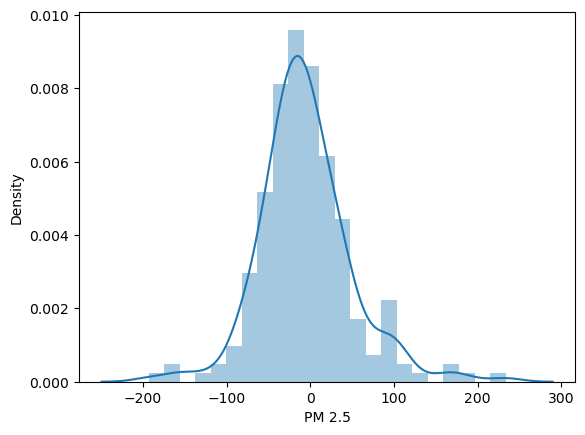

In [25]:
sns.distplot(y_test - prediction)

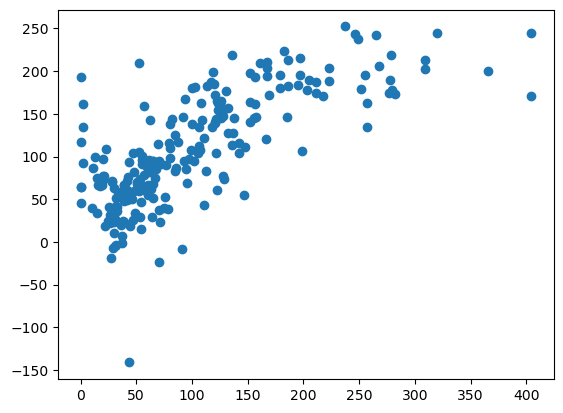

In [26]:
plt.scatter(y_test, prediction)

# Regression Evaluation Metrics

In [27]:
from sklearn import metrics

In [28]:
print('MAE : ',metrics.mean_absolute_error(y_test, prediction))
print('MSE : ',metrics.mean_squared_error(y_test, prediction))
print('RMSE : ',np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE :  40.283355371329385
MSE :  3057.6641286741374
RMSE :  55.29614931144968


In [29]:
import pickle

In [30]:
# open a file where we want to store the data
file = open('regresion_model.pkl', 'wb')

# dump the data to that file
pickle.dump(regressor, file)

# Ridge and Lasso Regression

### Ridge Regression

In [31]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

In [32]:
ridge = Ridge()
parameters = {'alpha': [1e-15, 1e-10, 1e-8, 1e-3, 1e-2, 1, 5, 10, 20,30,35,40,45]}
ridge_regressor = GridSearchCV(ridge, parameters, scoring = 'neg_mean_squared_error', cv = 5)
ridge_regressor.fit(X,y)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 0.001, 0.01, 1, 5, 10,
                                   20, 30, 35, 40, 45]},
             scoring='neg_mean_squared_error')

In [33]:
print(ridge_regressor.best_params_)
print(ridge_regressor.best_score_)

{'alpha': 45}
-3347.9708784987206


### Lasso Regression

In [34]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

In [35]:
lasso = Lasso()
parameters = {'alpha': [1e-15, 1e-10, 1e-8, 1e-3, 1e-2, 1, 5, 10, 20,30,35,40,45]}
lasso_regressor = GridSearchCV(lasso, parameters, scoring = 'neg_mean_squared_error', cv = 5)
lasso_regressor.fit(X,y)

print(lasso_regressor.best_params_)
print(lasso_regressor.best_score_)

{'alpha': 5}
-3356.4102569706833


### Model Evaluation

In [36]:
from sklearn import metrics

In [37]:
print('MAE : ',metrics.mean_absolute_error(y_test, prediction))
print('MSE : ',metrics.mean_squared_error(y_test, prediction))
print('RMSE : ',np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE :  40.283355371329385
MSE :  3057.6641286741374
RMSE :  55.29614931144968


In [38]:
import pickle

In [39]:
file = open('lasso_regression_model.pkl', 'wb')

# dump the information to the file
pickle.dump(lasso_regressor, file)

# Decision Tree regressor

In [40]:
from sklearn.tree import DecisionTreeRegressor

In [41]:
dtree = DecisionTreeRegressor(criterion = "squared_error")

In [42]:
dtree.fit(X_train,y_train)

DecisionTreeRegressor()

In [43]:
print('coefficient of determination R^2 on train data is : ', dtree.score(X_train, y_train))

coefficient of determination R^2 on train data is :  1.0


In [44]:
print('coefficient of determination R^2 on test data is : ', dtree.score(X_test, y_test))

coefficient of determination R^2 on test data is :  0.2992555479189729


#### here my R^2 score on train data  is 100% and on test data is 28%, this is a case of overfitting

In [45]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(dtree, X, y, cv = 5)

In [46]:
score.mean()

0.06101460897278588

# Tree visualization


In [47]:
from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus

In [48]:
features = list(df.columns[:-1])
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [49]:
import os
os.environ['PATH'] = os.environ['PATH']+ ';'+ os.environ['CONDA_PREFIX']+ r"/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/graphviz/"

In [50]:
dot_data = StringIO()
export_graphviz(dtree, out_file = dot_data, feature_names = features, filled = True, rounded = True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.998263 to fit



In [51]:
prediction = dtree.predict(X_test)

<Axes: xlabel='PM 2.5', ylabel='Density'>

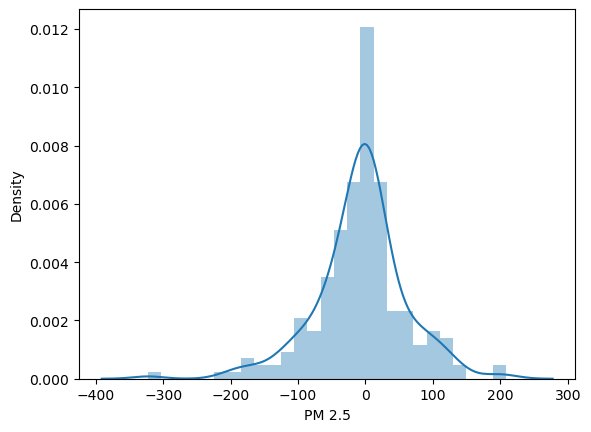

In [52]:
sns.distplot(y_test-prediction)

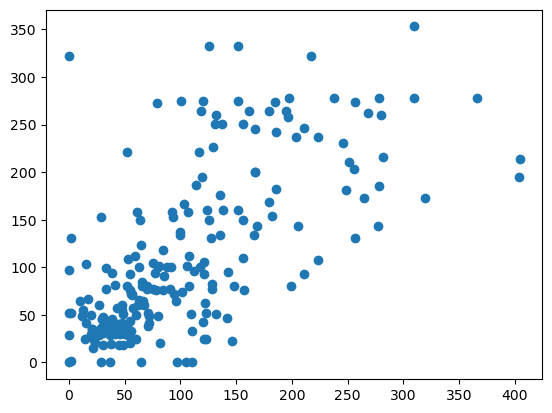

In [53]:
plt.scatter(y_test,prediction)

# Hyperparameter Tuning for decision Tree regressor

In [54]:
decision_tree_params = {
    'criterion': ['mse', 'friedman_mse', 'mae'],  # Splitting criterion
    'splitter': ['best', 'random'],  # Strategy used to choose the split at each node
    'max_depth': [3, 4, 5, 8, 10, 14, 15],  # Maximum depth of the tree
    'min_samples_leaf': [1, 2, 4],  # Minimum number of samples required to be at a leaf node
    'max_features': ['auto', 'sqrt', 'log2', None],  # Number of features to consider for the best split
    'min_weight_fraction_leaf': [0.0, 0.1, 0.2, 0.3, 0.4],  # Minimum weighted fraction of the sum total of weights
     'random_state':[0]}




In [55]:
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

In [56]:
random_search = GridSearchCV(dtree, param_grid=decision_tree_params, scoring = 'neg_mean_squared_error', n_jobs = -1, verbose = 3)

In [57]:
# Fit your model
random_search.fit(X, y)

Fitting 5 folds for each of 2520 candidates, totalling 12600 fits
[CV 2/5] END criterion=mse, max_depth=3, max_features=auto, min_samples_leaf=1, min_weight_fraction_leaf=0.0, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=3, max_features=auto, min_samples_leaf=1, min_weight_fraction_leaf=0.0, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=3, max_features=auto, min_samples_leaf=1, min_weight_fraction_leaf=0.1, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=3, max_features=auto, min_samples_leaf=1, min_weight_fraction_leaf=0.1, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=3, max_features=auto, min_samples_leaf=1, min_weight_fraction_leaf=0.1, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=3, max_features=auto, min_samples

[CV 3/5] END criterion=mse, max_depth=5, max_features=log2, min_samples_leaf=1, min_weight_fraction_leaf=0.1, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=5, max_features=log2, min_samples_leaf=1, min_weight_fraction_leaf=0.1, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=5, max_features=log2, min_samples_leaf=1, min_weight_fraction_leaf=0.1, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=5, max_features=log2, min_samples_leaf=1, min_weight_fraction_leaf=0.1, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=5, max_features=log2, min_samples_leaf=1, min_weight_fraction_leaf=0.1, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=5, max_features=log2, min_samples_leaf=1, min_weight_fraction_leaf=0.1, random_state=0, splitter=random

/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, expli

_fraction_leaf=0.3, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=8, max_features=None, min_samples_leaf=2, min_weight_fraction_leaf=0.3, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=8, max_features=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=8, max_features=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=8, max_features=None, min_samples_leaf=2, min_weight_fraction_leaf=0.4, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=8, max_features=None

/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, expli

[CV 4/5] END criterion=mse, max_depth=15, max_features=None, min_samples_leaf=4, min_weight_fraction_leaf=0.0, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=mse, max_depth=15, max_features=None, min_samples_leaf=4, min_weight_fraction_leaf=0.0, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=mse, max_depth=15, max_features=None, min_samples_leaf=4, min_weight_fraction_leaf=0.0, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=mse, max_depth=15, max_features=None, min_samples_leaf=4, min_weight_fraction_leaf=0.0, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=mse, max_depth=15, max_features=None, min_samples_leaf=4, min_weight_fraction_leaf=0.0, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=mse, max_depth=15, max_features=None, min_samples_leaf=4, min_weight_fraction_leaf=0.0, random_state=0, splitte

/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, expli

=friedman_mse, max_depth=3, max_features=auto, min_samples_leaf=2, min_weight_fraction_leaf=0.4, random_state=0, splitter=best;, score=-4993.485 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_depth=3, max_features=auto, min_samples_leaf=2, min_weight_fraction_leaf=0.4, random_state=0, splitter=best;, score=-4304.744 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_depth=3, max_features=auto, min_samples_leaf=2, min_weight_fraction_leaf=0.4, random_state=0, splitter=best;, score=-4612.602 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_depth=3, max_features=auto, min_samples_leaf=2, min_weight_fraction_leaf=0.4, random_state=0, splitter=best;, score=-3829.440 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_depth=3, max_features=auto, min_samples_leaf=2, min_weight_fraction_leaf=0.4, random_state=0, splitter=random;, score=-3485.874 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_depth=3, max_features=auto, min_samples_leaf=2, m

/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, expli

[CV 5/5] END criterion=friedman_mse, max_depth=5, max_features=log2, min_samples_leaf=2, min_weight_fraction_leaf=0.3, random_state=0, splitter=best;, score=-3829.440 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_depth=5, max_features=log2, min_samples_leaf=2, min_weight_fraction_leaf=0.3, random_state=0, splitter=random;, score=-3310.903 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_depth=5, max_features=log2, min_samples_leaf=2, min_weight_fraction_leaf=0.3, random_state=0, splitter=random;, score=-4765.362 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_depth=5, max_features=log2, min_samples_leaf=2, min_weight_fraction_leaf=0.3, random_state=0, splitter=random;, score=-4717.558 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_depth=5, max_features=log2, min_samples_leaf=2, min_weight_fraction_leaf=0.3, random_state=0, splitter=random;, score=-4685.370 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_depth=5, max_features

/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, expli

[CV 2/5] END criterion=friedman_mse, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_weight_fraction_leaf=0.0, random_state=0, splitter=random;, score=-4335.071 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_weight_fraction_leaf=0.0, random_state=0, splitter=random;, score=-6257.853 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_weight_fraction_leaf=0.0, random_state=0, splitter=random;, score=-4481.626 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_weight_fraction_leaf=0.0, random_state=0, splitter=random;, score=-4446.440 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_weight_fraction_leaf=0.1, random_state=0, splitter=best;, score=-3115.051 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_depth=5, max_features

/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
/Users/gauravsharma/anaconda3/lib/python3.11/site-packages/sklearn/tree/_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, expli

37.326 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_depth=10, max_features=auto, min_samples_leaf=4, min_weight_fraction_leaf=0.3, random_state=0, splitter=best;, score=-4382.448 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_depth=10, max_features=auto, min_samples_leaf=4, min_weight_fraction_leaf=0.3, random_state=0, splitter=best;, score=-4271.214 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_depth=10, max_features=auto, min_samples_leaf=4, min_weight_fraction_leaf=0.3, random_state=0, splitter=best;, score=-4715.078 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_depth=10, max_features=auto, min_samples_leaf=4, min_weight_fraction_leaf=0.3, random_state=0, splitter=random;, score=-3485.874 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_depth=10, max_features=auto, min_samples_leaf=4, min_weight_fraction_leaf=0.3, random_state=0, splitter=random;, score=-4765.362 total time=   0.0s
[CV 3/5] END criterion=friedman_mse

[CV 4/5] END criterion=friedman_mse, max_depth=14, max_features=log2, min_samples_leaf=1, min_weight_fraction_leaf=0.3, random_state=0, splitter=best;, score=-3705.459 total time=   0.0s
[CV 5/5] END criterion=friedman_mse, max_depth=14, max_features=log2, min_samples_leaf=1, min_weight_fraction_leaf=0.3, random_state=0, splitter=best;, score=-3829.440 total time=   0.0s
[CV 1/5] END criterion=friedman_mse, max_depth=14, max_features=log2, min_samples_leaf=1, min_weight_fraction_leaf=0.3, random_state=0, splitter=random;, score=-3310.903 total time=   0.0s
[CV 2/5] END criterion=friedman_mse, max_depth=14, max_features=log2, min_samples_leaf=1, min_weight_fraction_leaf=0.3, random_state=0, splitter=random;, score=-4765.362 total time=   0.0s
[CV 3/5] END criterion=friedman_mse, max_depth=14, max_features=log2, min_samples_leaf=1, min_weight_fraction_leaf=0.3, random_state=0, splitter=random;, score=-4717.558 total time=   0.0s
[CV 4/5] END criterion=friedman_mse, max_depth=14, max_feat

[CV 5/5] END criterion=mae, max_depth=15, max_features=auto, min_samples_leaf=4, min_weight_fraction_leaf=0.2, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=mae, max_depth=15, max_features=auto, min_samples_leaf=4, min_weight_fraction_leaf=0.2, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=mae, max_depth=15, max_features=auto, min_samples_leaf=4, min_weight_fraction_leaf=0.2, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=mae, max_depth=15, max_features=auto, min_samples_leaf=4, min_weight_fraction_leaf=0.2, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=mae, max_depth=15, max_features=auto, min_samples_leaf=4, min_weight_fraction_leaf=0.2, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=mae, max_depth=15, max_features=auto, min_samples_leaf=4, min_weight_fraction_leaf=0.2, random_state=0, split

GridSearchCV(estimator=DecisionTreeRegressor(), n_jobs=-1,
             param_grid={'criterion': ['mse', 'friedman_mse', 'mae'],
                         'max_depth': [3, 4, 5, 8, 10, 14, 15],
                         'max_features': ['auto', 'sqrt', 'log2', None],
                         'min_samples_leaf': [1, 2, 4],
                         'min_weight_fraction_leaf': [0.0, 0.1, 0.2, 0.3, 0.4],
                         'random_state': [0], 'splitter': ['best', 'random']},
             scoring='neg_mean_squared_error', verbose=3)

In [58]:
random_search.best_params_

{'criterion': 'friedman_mse',
 'max_depth': 5,
 'max_features': 'log2',
 'min_samples_leaf': 1,
 'min_weight_fraction_leaf': 0.1,
 'random_state': 0,
 'splitter': 'best'}

In [59]:
random_search.best_score_

-3245.139325642468

In [60]:
prediction = random_search.predict(X_test)

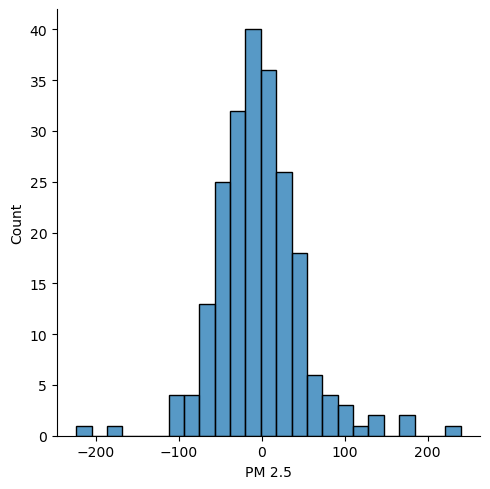

In [61]:
sns.displot(y_test-prediction)

In [62]:
print('MAE : ',metrics.mean_absolute_error(y_test, prediction))
print('MSE : ',metrics.mean_squared_error(y_test, prediction))
print('RMSE : ',np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE :  37.641964864011925
MSE :  2784.257153320479
RMSE :  52.76606061968696


In [63]:
import pickle

In [64]:
file = open('decision_regressor_model.pkl', 'wb')

pickle.dump(random_search,file)

# RandomForest Regressor

In [65]:
from sklearn.ensemble import RandomForestRegressor

In [66]:
forest_regressor = RandomForestRegressor()

In [67]:
forest_regressor.fit(X_train,y_train)

RandomForestRegressor()

In [68]:
print('coefficient of determination R^2 on train data is : ', forest_regressor.score(X_train, y_train))

coefficient of determination R^2 on train data is :  0.9475164480721305


In [69]:
print('coefficient of determination R^2 on train data is : ', forest_regressor.score(X_test, y_test))

coefficient of determination R^2 on train data is :  0.643095763852281


In [70]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(forest_regressor, X, y, cv = 5)

In [71]:
score.mean()

0.4977771700210905

# Hyperparameter Tuning for RandomForest

In [72]:
from sklearn.model_selection import RandomizedSearchCV

In [73]:
# number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]

# number of features to be considered at every split
max_features = ['auto','sqrt']

# maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5,30,num = 6)]

# minimum number of samples required to split a node
min_samples_split = [2,5,10,15,100]

# minimum number of samples required at each leaf node
min_samples_leaf = [1,2,5,10]


In [74]:
random_grid = {'n_estimators': n_estimators,
               'max_features':max_features,
               'max_depth' : max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}
print(random_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200], 'max_features': ['auto', 'sqrt'], 'max_depth': [5, 10, 15, 20, 25, 30], 'min_samples_split': [2, 5, 10, 15, 100], 'min_samples_leaf': [1, 2, 5, 10]}


In [75]:
rf = RandomForestRegressor()

In [76]:
rf_random = RandomizedSearchCV(estimator = rf, param_distributions=random_grid, scoring = 'neg_mean_squared_error', n_iter=100, cv = 5, verbose = 2, random_state = 0)

In [77]:
rf_random.fit(X_train,y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=600; total time=   0.5s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=600; total time=   0.5s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=600; total time=   0.6s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=600; total time=   0.5s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=600; total time=   0.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=500; total time=   0.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_esti

[CV] END max_depth=30, max_features=auto, min_samples_leaf=10, min_samples_split=100, n_estimators=700; total time=   0.4s
[CV] END max_depth=30, max_features=auto, min_samples_leaf=10, min_samples_split=100, n_estimators=700; total time=   0.4s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=900; total time=   0.6s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=900; total time=   0.6s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=900; total time=   0.6s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=900; total time=   0.7s
[CV] END max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=15, n_estimators=900; total time=   0.6s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=10, min_samples_split=15, n_estimators=900; total time=   0.6s
[CV] END max_depth=10, max_featu

[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=100, n_estimators=400; total time=   0.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=100, n_estimators=400; total time=   0.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=100, n_estimators=400; total time=   0.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=100, n_estimators=400; total time=   0.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   0.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   0.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   0.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1200; total time=   0.6s
[CV] END max_depth=25, m

[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=100; total time=   0.0s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=100, n_estimators=800; total time=   0.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=100, n_estimators=800; total time=   0.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=100, n_estimators=800; total time=   0.3s
[CV] END max_depth=5, max_featur

[CV] END max_depth=25, max_features=auto, min_samples_leaf=10, min_samples_split=15, n_estimators=500; total time=   0.4s
[CV] END max_depth=25, max_features=auto, min_samples_leaf=10, min_samples_split=15, n_estimators=500; total time=   0.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=1100; total time=   0.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=1100; total time=   0.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=1100; total time=   0.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=1100; total time=   0.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=1100; total time=   0.5s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=100, n_estimators=1200; total time=   0.7s
[CV] END max_depth=10, 

[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=700; total time=   0.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=700; total time=   0.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=700; total time=   0.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=5, min_samples_split=15, n_estimators=700; total time=   0.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=100, n_estimators=100; total time=   0.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=100, n_estimators=100; total time=   0.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=100, n_estimators=100; total time=   0.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=100, n_estimators=100; total time=   0.0s
[CV] END max_depth=10, max_f

[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=800; total time=   0.4s
[CV] END max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   0.6s
[CV] END max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   0.6s
[CV] END max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   0.6s
[CV] END max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   0.6s
[CV] END max_depth=15, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=600; total time=   0.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=1100; total time=   0.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=1100; total time=   0.5s
[CV] END max_depth=30, max_features=

[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   0.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=1200; total time=   0.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=1200; total time=   0.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=1200; total time=   0.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=1200; total time=   0.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=1200; total time=   0.7s
[CV] END max_depth=15, max_features=auto, min_samples_leaf=10, min_samples_split=5, n_estimators=700; total time=   0.5s
[CV] END max_depth=15, max_feature

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_iter=100,
                   param_distributions={'max_depth': [5, 10, 15, 20, 25, 30],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 5, 10],
                                        'min_samples_split': [2, 5, 10, 15,
                                                              100],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000, 1100,
                                                         1200]},
                   random_state=0, scoring='neg_mean_squared_error', verbose=2)

In [78]:
rf_random.best_params_

{'n_estimators': 400,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 20}

In [79]:
rf_random.best_score_

-2586.102214755153

In [80]:
predictions = rf_random.predict(X_test)

<Axes: xlabel='PM 2.5', ylabel='Density'>

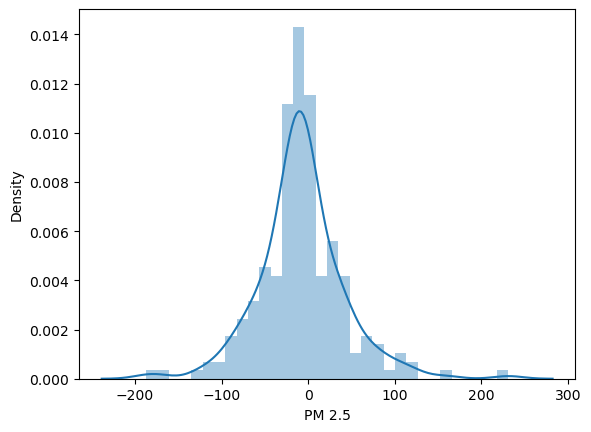

In [81]:
sns.distplot(y_test-predictions)

In [82]:
print('MAE : ',metrics.mean_absolute_error(y_test, prediction))
print('MSE : ',metrics.mean_squared_error(y_test, prediction))
print('RMSE : ',np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE :  37.641964864011925
MSE :  2784.257153320479
RMSE :  52.76606061968696


In [83]:
import pickle

In [84]:
file = open('random_forest_regression_model.pkl', 'wb')

pickle.dump(rf_random, file)

[CV 1/5] END criterion=mae, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_weight_fraction_leaf=0.4, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=mae, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_weight_fraction_leaf=0.4, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=mae, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_weight_fraction_leaf=0.4, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=mae, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_weight_fraction_leaf=0.4, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=mae, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_weight_fraction_leaf=0.4, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=mae, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_weight_fraction_leaf=0.0, random_state=0, splitter=

[CV 5/5] END criterion=mae, max_depth=15, max_features=None, min_samples_leaf=4, min_weight_fraction_leaf=0.2, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=mae, max_depth=15, max_features=log2, min_samples_leaf=1, min_weight_fraction_leaf=0.4, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=mae, max_depth=15, max_features=log2, min_samples_leaf=2, min_weight_fraction_leaf=0.0, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=mae, max_depth=15, max_features=log2, min_samples_leaf=2, min_weight_fraction_leaf=0.0, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=mae, max_depth=15, max_features=log2, min_samples_leaf=2, min_weight_fraction_leaf=0.1, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=mae, max_depth=15, max_features=log2, min_samples_leaf=2, min_weight_fraction_leaf=0.2, random_state=0, split

[CV 4/5] END criterion=mae, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_weight_fraction_leaf=0.1, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=mae, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_weight_fraction_leaf=0.1, random_state=0, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=mae, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_weight_fraction_leaf=0.2, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=mae, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_weight_fraction_leaf=0.2, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=mae, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_weight_fraction_leaf=0.2, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=mae, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_weight_fraction_leaf=0.2, random_state=0, splitter=

[CV 1/5] END criterion=mae, max_depth=14, max_features=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=mae, max_depth=14, max_features=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=mae, max_depth=14, max_features=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=mae, max_depth=14, max_features=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=mae, max_depth=14, max_features=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=mae, max_depth=14, max_features=None, min_samples_leaf=4, min_weight_fraction_leaf=0.1, random_state=0, splitter=rand

[CV 1/5] END criterion=mae, max_depth=8, max_features=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=mae, max_depth=8, max_features=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=mae, max_depth=8, max_features=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=mae, max_depth=8, max_features=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=mae, max_depth=8, max_features=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, random_state=0, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=mae, max_depth=8, max_features=None, min_samples_leaf=2, min_weight_fraction_leaf=0.1, random_state=0, splitter=random;, s